<a href="https://colab.research.google.com/github/TalhaAhmed2000/DeepLearning/blob/main/Task 2/Person_Segmentation_CNN_AutoEncoders.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Importing Libaries pertaining to:

***Miscellanous***
- `numpy`
- `pandas`
- `random`
- `google.colab.drive`
- `typing.Dict, typing.List, typing.Tuple`

***Pytorch***
- `torch`
- `torch.nn`
- `torchvision`

***Processing + Loading of Data***
- `torchvision.transforms`
- `torchvision.datasets`
- `torch.utils.data.Dataset`
- `torch.utils.data.DataLoader`
- `pathlib.Path`
- `requests`
- `zipfile`
- `os`

***Visualization/Evaluation of Model Results***
- `torchinfo.summary`
- `torch.utils.tensorboard.SummaryWriter`
- `tqdm.auto`
- `PIL.Image`
- `matplotlib.pyplot.plt`
- `timeit.default_timer`
- `torchmetrics`
- `mlxtend`

In [ ]:
# Importing Relevant Libraries

# Micellaneous
import numpy as np
import pandas as pd
import random
from google.colab import drive
drive.mount('/content/drive')
from typing import Dict, List, Tuple

# Pytorch Libraries
import torch
from torch import nn
import torchvision

# Processing + Loading of Data
from torchvision import transforms
from torchvision import datasets
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
import zipfile
import requests
from pathlib import Path
import os

# Visualization/Evaluation of Model Results
# Try to get torchinfo, install it if it doesn't work
try:
    from torchinfo import summary
except:
    print("[INFO] Couldn't find torchinfo... installing it.")
    !pip install -q torchinfo
    from torchinfo import summary
from torch.utils.tensorboard import SummaryWriter
from timeit import default_timer as timer
from PIL import Image
from tqdm.auto import tqdm
import matplotlib.pyplot as plt

Mounted at /content/drive
[INFO] Couldn't find torchinfo... installing it.


In [ ]:
# See if torchmetrics exists, if not, install it
try:
    import torchmetrics, mlxtend
    print(f"mlxtend version: {mlxtend.__version__}")
    assert int(mlxtend.__version__.split(".")[1]) >= 19, "mlxtend verison should be 0.19.0 or higher"
except:
    !pip install -q torchmetrics -U mlxtend # <- Note: If you're using Google Colab, this may require restarting the runtime
    import torchmetrics, mlxtend
    print(f"mlxtend version: {mlxtend.__version__}")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 729.2/729.2 kB 29.2 MB/s eta 0:00:00
mlxtend version: 0.22.0


### Downloading & Processing of Data from Github <a href = https://github.com/TalhaAhmed2000/DeepLearning/tree/main/Task%202/Final%20Data> data</a>




In [ ]:
# Clone github to access to access data
!git clone https://github.com/TalhaAhmed2000/DeepLearning.git
!mv DeepLearning/'Task 2'/Final Data segmentation_mask_data

Cloning into 'DeepLearning'...
remote: Enumerating objects: 16065, done.
remote: Counting objects: 100% (446/446), done.
remote: Compressing objects: 100% (229/229), done.
remote: Total 16065 (delta 239), reused 392 (delta 209), pack-reused 15619
Receiving objects: 100% (16065/16065), 2.27 GiB | 17.90 MiB/s, done.
Resolving deltas: 100% (505/505), done.
Updating files: 100% (25715/25715), done.
mv: target 'segmentation_mask_data' is not a directory


In [ ]:
# Path for the formatted data - refer to custom_data_creation.ipynb notebook in github
root_path = Path('/content/DeepLearning/Task 2/Final Data')
image_path = root_path / 'images'
mask_path = root_path / 'mask'

# Observing how the data is structured
for dirpath, dirnames, filenames in os.walk(root_path):
  print(f"There are {len(dirnames)} directories and {len(filenames)} images in '{dirpath}'.")

There are 2 directories and 0 images in '/content/DeepLearning/Task 2/Final Data'.
There are 2 directories and 0 images in '/content/DeepLearning/Task 2/Final Data/images'.
There are 0 directories and 239 images in '/content/DeepLearning/Task 2/Final Data/images/test'.
There are 0 directories and 953 images in '/content/DeepLearning/Task 2/Final Data/images/train'.
There are 2 directories and 0 images in '/content/DeepLearning/Task 2/Final Data/mask'.
There are 0 directories and 239 images in '/content/DeepLearning/Task 2/Final Data/mask/test'.
There are 0 directories and 953 images in '/content/DeepLearning/Task 2/Final Data/mask/train'.


In [ ]:
# Since datasets subclassed from torch.utils.data.Dataset return images and their corresponding label (in our case a mask image) we will need to create a custom
# data which overrided the "getitem" function. For good practice, we will also override the "len" method. The following python script define a custom dataset class
# called SegmentationDataset, which inherits from torch.utils.data.Dataset.
# The constructor (__init__) takes the root directory of the dataset and an optional transform argument for data augmentation
# Depending on which split we want (train or test), we return datsets in both cases so that we can create dataloaders for both

In [ ]:
# Get custom_dataset.py from github
try:
  from py_scripts import get_custom_data
except:
  !mv DeepLearning/"Task 2"/python_scripts py_scripts
  from py_scripts import custom_dataset

In [ ]:
# Getting custom dataset

# Specifying Transform
data_transform = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Lambda(lambda x: x[:3, :, :]), # Keeping first 3 color channels out of 4 (for mask images)
      ])

train_dataset = custom_dataset.SegmentationDataset(root_path, split = 'train', transform = data_transform)
test_dataset = custom_dataset.SegmentationDataset(root_path, split = 'test', transform = data_transform)

# Converting it into DataLoader
train_dataloader = DataLoader(train_dataset, batch_size = 32, shuffle = True)
test_dataloader = DataLoader(test_dataset, batch_size = 32, shuffle = False)

train_dataloader, test_dataloader

(<torch.utils.data.dataloader.DataLoader at 0x797fc4925090>,
 <torch.utils.data.dataloader.DataLoader at 0x797fc49250f0>)

Random image path: /content/DeepLearning/Task 2/Final Data/images/train/Sports_Volleyball_C2_00315.png
Image class: train
Image height: 384
Image width: 512


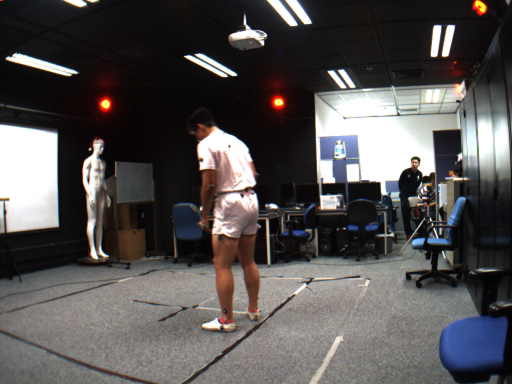

In [ ]:
# Let's Visualize an image using Image

# Set seed
random.seed(42) # <- try changing this and see what happens

# 1. Get all image paths (* means "any combination")
image_path_list = list(root_path.glob("*/*/*.png"))

# 2. Get random image path
random_image_path = random.choice(image_path_list)

# 3. Get image class from path name (the image class is the name of the directory where the image is stored)
image_class = random_image_path.parent.stem

# 4. Open image
img = Image.open(random_image_path)

# 5. Print metadata
print(f"Random image path: {random_image_path}")
print(f"Image class: {image_class}")
print(f"Image height: {img.height}")
print(f"Image width: {img.width}")
img

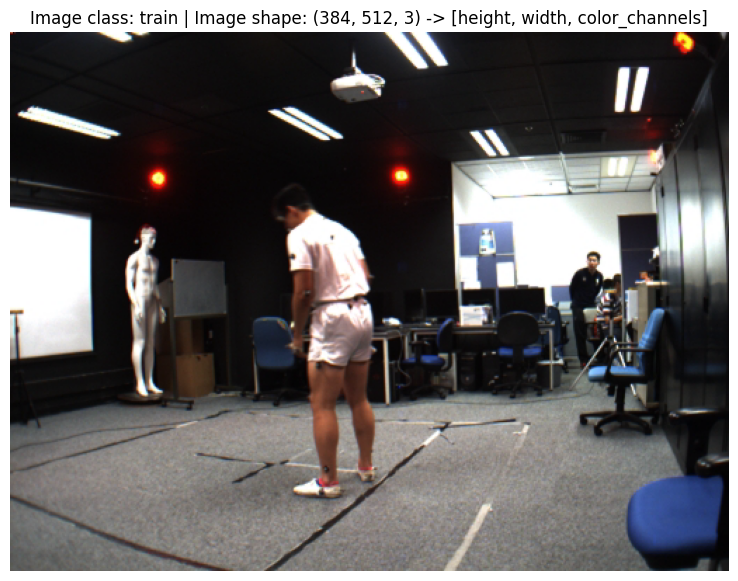

In [ ]:
# Using Numpy

# Turn the image into an array
img_as_array = (np.asarray(img))[:, :, :3]

# Plot the image with matplotlib
plt.figure(figsize = (10, 7))
plt.imshow(img_as_array)
plt.title(f"Image class: {image_class} | Image shape: {img_as_array.shape} -> [height, width, color_channels]")
plt.axis(False);

In [ ]:
# Making a helper function for plotting images with transforms

def plot_transformed_images(image_paths, transform, n = 3, seed = 42):
    """Plots a series of random images from image_paths.

    Will open n image paths from image_paths, transform them
    with transform and plot them side by side.

    Args:
        image_paths (list): List of target image paths.
        transform (PyTorch Transforms): Transforms to apply to images.
        n (int, optional): Number of images to plot. Defaults to 3.
        seed (int, optional): Random seed for the random generator. Defaults to 42.
    """
    random.seed(seed)
    random_image_paths = random.sample(image_paths, k=n)
    for image_path in random_image_paths:
        with Image.open(image_path) as f:
            fig, ax = plt.subplots(1, 2)
            ax[0].imshow(f)
            ax[0].set_title(f"Original \nSize: {f.size}")
            ax[0].axis("off")

            # Transform and plot image
            # Note: permute() will change shape of image to suit matplotlib
            # (PyTorch default is [C, H, W] but Matplotlib is [H, W, C])
            transformed_image = transform(f).permute(1, 2, 0)
            print(f'transformed_image.shape {transformed_image.shape}')
            ax[1].imshow(transformed_image)
            ax[1].set_title(f"Transformed \nSize: {transformed_image.shape}")
            ax[1].axis("off")
            ax[1].set_aspect('equal')  # Set aspect ratio to be equal

            fig.suptitle(f"Class: {image_path.parent.stem}", fontsize=16)

transformed_image.shape torch.Size([256, 256, 3])
transformed_image.shape torch.Size([256, 256, 3])
transformed_image.shape torch.Size([256, 256, 3])


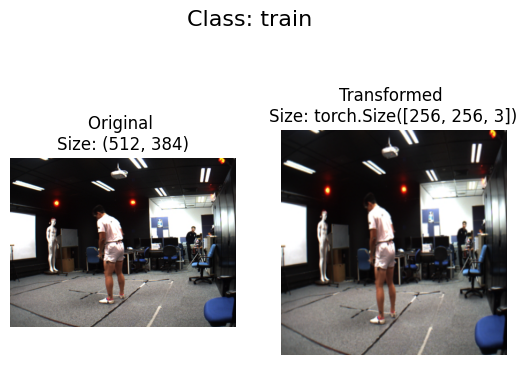

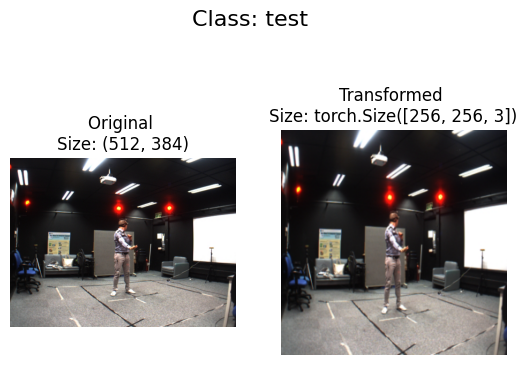

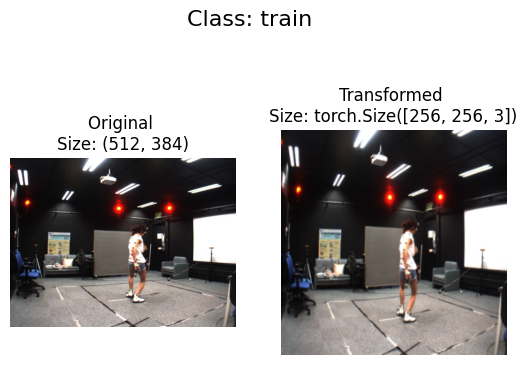

In [ ]:
# Defining Transform of our data

data_transform = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Lambda(lambda x: x[:3, :, :]), # Keeping first 3 color channels out of 4 (for mask images)
      ])

plot_transformed_images(image_path_list,
                        transform = data_transform,
                        n = 3)

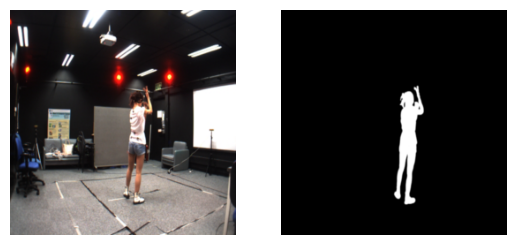

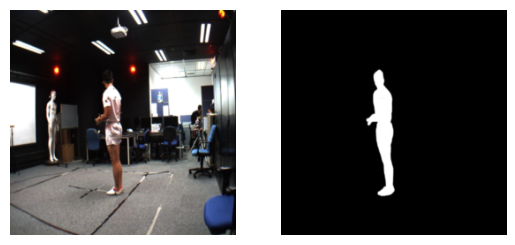

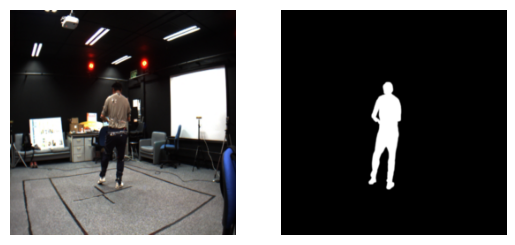

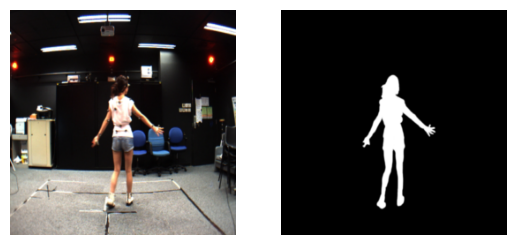

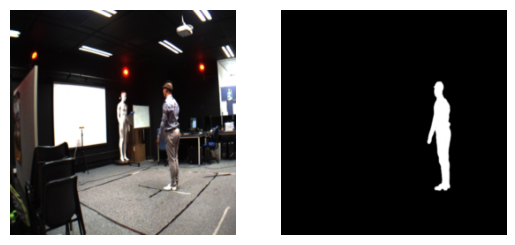

...

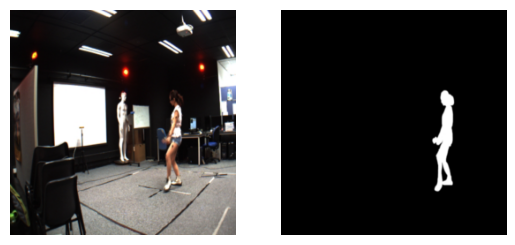

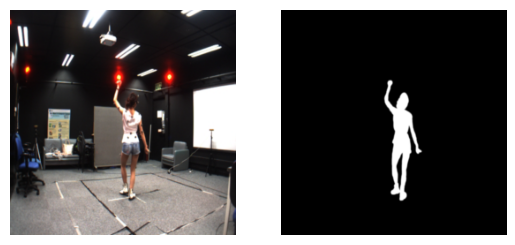

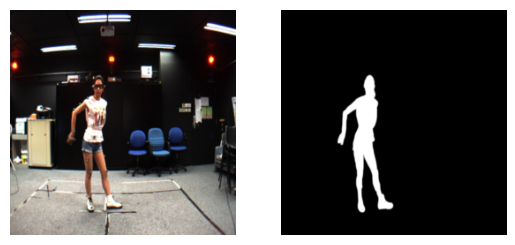

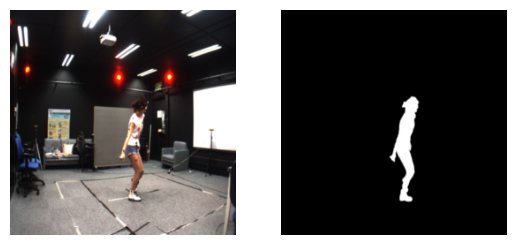

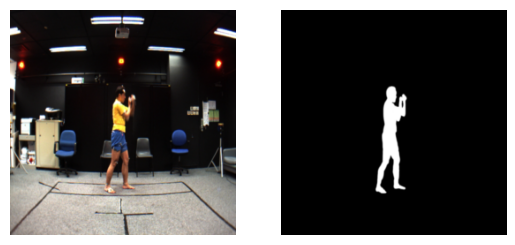

In [ ]:
# Checking getitem method

img, mask = next(iter(train_dataloader))

for i, t in zip(img, mask):
  plt.subplot(1, 2, 1)
  plt.imshow(i.permute(1, 2, 0))
  plt.axis("off")
  plt.subplot(1, 2, 2)
  plt.imshow(t.permute(1, 2, 0), cmap="gray")
  plt.axis("off")
  plt.show()

### Works Perfectly Fine!

In [ ]:
# Setting Up Device Agnostic Capability
device = 'cuda' if torch.cuda.is_available else 'cpu'
device

'cuda'

In [ ]:
# Building the Convolutional AutoEncoder. Recieves an input of size 256 x 256 x 3

class Conv_AutoEncoder(nn.Module):
  def __init__(self):
    super().__init__()
    # Encoder
    self.block_encoder1 = nn.Sequential(
      nn.Conv2d(in_channels = 3, out_channels = 16, kernel_size = 3, stride = 1, padding = 1), # -> N, 16, 14, 14
      nn.ReLU(),
      nn.BatchNorm2d(num_features = 16),
      nn.MaxPool2d(kernel_size = 2, stride = 2)
    )
    self.block_encoder2 = nn.Sequential(
      nn.Conv2d(in_channels = 16, out_channels = 32, kernel_size = 3, stride = 1, padding = 1), # -> N, 16, 14, 14
      nn.ReLU(),
      nn.BatchNorm2d(num_features = 32),
      nn.MaxPool2d(kernel_size = 2, stride = 2)
    )
    self.block_encoder3 = nn.Sequential(
        nn.Conv2d(in_channels = 32, out_channels = 64, kernel_size = 3, stride = 1, padding = 1),
        nn.ReLU(),
        nn.BatchNorm2d(num_features = 64),
        nn.MaxPool2d(kernel_size = 2, stride = 2)
    )

    # Decoder
    self.block_decoder1 = nn.Sequential(
      nn.ConvTranspose2d(in_channels = 64, out_channels = 32, kernel_size = 2, stride = 2), # -> N, 32, 7, 7
      nn.BatchNorm2d(num_features = 32)
    )
    self.block_decoder2 = nn.Sequential(
      nn.ConvTranspose2d(in_channels = 32, out_channels = 16, kernel_size = 2, stride = 2), # -> N, 32, 7, 7
      nn.BatchNorm2d(num_features = 16),
    )

    self.classifier = nn.Sequential(
      nn.ConvTranspose2d(in_channels = 16, out_channels = 3, kernel_size = 2, stride = 2), # N, 1, 28, 28  (N,1,27,27)
      nn.Sigmoid()
    )

  def forward(self, x):
    # Encoder Output
    en_block1_out = self.block_encoder1(x)
    # print(f'Encoder block1_out.shape {en_block1_out.shape}')
    en_block2_out = self.block_encoder2(en_block1_out)
    # print(f'Encoder block2_out.shape {en_block2_out.shape}')
    en_block3_out = self.block_encoder3(en_block2_out)
    # print(f'Encoder block3_out.shape {en_block3_out.shape}')

    # Decoder Output
    de_block1_out = self.block_decoder1(en_block3_out)
    # print(f'Decoder block1_out.shape {de_block1_out.shape}')
    de_block2_out = self.block_decoder2(de_block1_out)
    # print(f'Decoder block2_out.shape {de_block2_out.shape}')

    # Classifier Output
    classifier_output = self.classifier(de_block2_out)
    # print(f'classifier_output.shape {classifier_output.shape}')
    return classifier_output

model_0 = Conv_AutoEncoder().to(device)
model_0

Conv_AutoEncoder(
  (block_encoder1): Sequential(
    (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (block_encoder2): Sequential(
    (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (block_encoder3): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (block_decoder1): Sequential(
    (0): ConvTranspose2d(64, 32, kernel_size=(2, 2)

In [ ]:
summary(model_0, input_size = [1, 3, 256, 256], col_names = ["input_size", "output_size", "num_params", "trainable"])

Layer (type:depth-idx)                   Input Shape               Output Shape              Param #                   Trainable
Conv_AutoEncoder                         [1, 3, 256, 256]          [1, 3, 256, 256]          --                        True
├─Sequential: 1-1                        [1, 3, 256, 256]          [1, 16, 128, 128]         --                        True
│    └─Conv2d: 2-1                       [1, 3, 256, 256]          [1, 16, 256, 256]         448                       True
│    └─ReLU: 2-2                         [1, 16, 256, 256]         [1, 16, 256, 256]         --                        --
│    └─BatchNorm2d: 2-3                  [1, 16, 256, 256]         [1, 16, 256, 256]         32                        True
│    └─MaxPool2d: 2-4                    [1, 16, 256, 256]         [1, 16, 128, 128]         --                        --
├─Sequential: 1-2                        [1, 16, 128, 128]         [1, 32, 64, 64]           --                        True
│    └─

In [ ]:
# Helper Function script from Github containing iou and dice coefficient calculation
from py_scripts import utils

In [ ]:
# The model takes a 3 x 256 x 256 input image and outputs a image with each pixel between 0 and 1 (scaled due to sigmoid). Upon using a threshold like 0.5, some pixels will be mapped to 0
# and others 1. Those that are mapped to 1 will form the mask of the image.

# Example forward pass - Modularizing it

def inference_plot_mask(model:torch.nn.Module,
                        dataloader: torch.utils.data.DataLoader,
                        device: torch.device,
                        threshold: torch.float = torch.tensor(0.5),
                        num_mask: int = 5):
  """
    Performs inference on num_mask number of images and plots the mask without and with thresholding

    Args:
    model (torch.nn.Module): The model (in our case CNN AutoEncoder) which will perform the inference on the image
    dataloader (torch.utils.data.DataLoader): The dataloader from which we will sample images and their corresponding ground truth mask
    device (torch.device): The device (cpu or gpu) on which to run the inference
    threshold (torch.float): The pixel values (between 0 - 1) of the image after forward pass will be mapped to 0 and 1 depending on the threshold. Defaults to 0.5
    num_mask (int): The number of sample images to perform inference and plot
  """

  # Some Plot and reproducibility settings
  plt.figure(figsize = (12, 5 * num_mask))
  torch.manual_seed(42)

  # 1) Intialize sample images and their corresponding ground truth mask as empty list. Fill it with randomly chosen images in a batch of 32

  sample_img = []
  sample_mask = []
  rand_img_in_batch = (torch.randint(0, 32 + 1, (1,))).item()

  for sample, mask in random.sample(list(dataloader), k = num_mask):

    sample_img.append(sample[rand_img_in_batch])
    sample_mask.append(mask[rand_img_in_batch])

  # 2) Perform Inference

  # Put model in eval mode
  model.eval()

  with torch.inference_mode():
    for i, sample in enumerate(sample_img):
      sample = sample.to(device)
      # Perform inference on unsqueezed image and then revert back to (C, H , W)
      pred_mask_without_threshold = ((model_0.forward(sample.to(device).unsqueeze(0))).squeeze(dim = 1)).cpu().squeeze()
      # Perform Thresholding
      pred_mask_with_threshold = torch.where(pred_mask_without_threshold >= threshold, torch.tensor(1.0), torch.tensor(0.0)).cpu()

      # Plotting the images and masks
      plt.subplot(num_mask, 5, 5 * i + 1)
      plt.imshow(sample.permute((1, 2, 0)).cpu().numpy())
      plt.title('Original Image', fontsize = 10)
      plt.axis("off")

      plt.subplot(num_mask, 5, 5 * i + 2)
      plt.imshow(sample_mask[i].permute((1, 2, 0)).cpu().numpy(), cmap = "gray")
      plt.title('Ground Truth Mask', fontsize = 10)
      plt.axis("off")

      # Plotting mask without threshold
      plt.subplot(num_mask, 5, 5 * i + 3)
      plt.imshow(pred_mask_without_threshold.permute((1, 2, 0)).detach().numpy(), cmap = "gray")
      plt.title('Mask without Threshold', fontsize = 10)
      plt.axis("off")

      # Plotting mask with threshold
      plt.subplot(num_mask, 5, 5 * i + 4)
      plt.imshow(pred_mask_with_threshold.permute((1, 2, 0)).detach().numpy(), cmap = "gray")
      plt.title(f'Mask with Threshold 0.5', fontsize = 10)
      plt.axis("off")

      # Calculate Dice and IOU coefficients using the utils.py python script
      groundtruth_mask = sample_mask[i].permute((1, 2, 0)).numpy()
      pred_mask = pred_mask_without_threshold.permute((1, 2, 0)).detach().numpy()
      dice_coeff = round(utils.dice_coef(groundtruth_mask, pred_mask), 4)
      iou_coeff = round(utils.iou(groundtruth_mask, pred_mask), 4)

      # Add Dice and IOU coefficients as text
      plt.subplot(num_mask, 5, 5 * i + 5)
      plt.title(f'Observation {i + 1}', fontsize = 10, ha = 'center', va = 'center')
      plt.text(0.5, 0.5, f"Dice: {dice_coeff}\nIOU: {iou_coeff:.4f}", fontsize = 8, ha ='center', va ='center')
      plt.axis("off")

# Adjust spacing between subplots
plt.tight_layout()

# Display the plot
plt.show()


<Figure size 640x480 with 0 Axes>

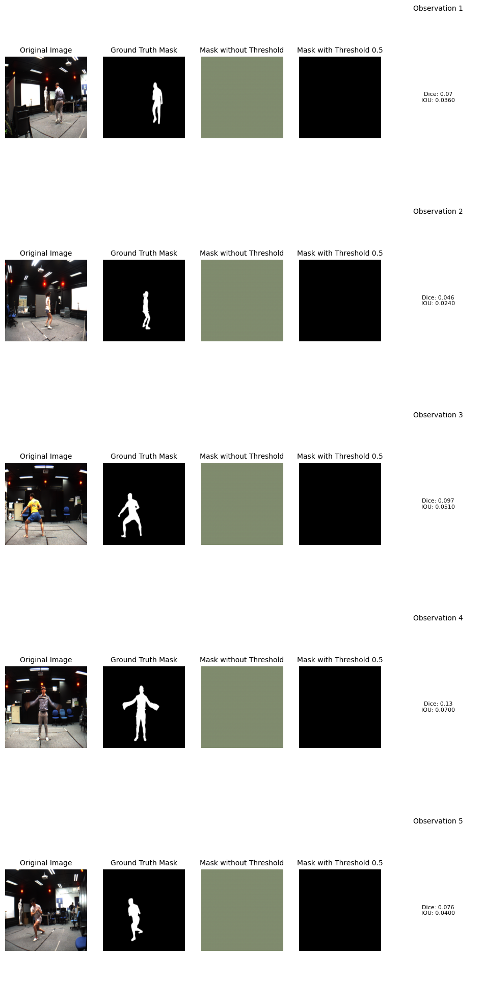

In [ ]:
inference_plot_mask(model_0, train_dataloader, torch.tensor(0.5).to(device), 5)

### Definitely Needs Training!

In [ ]:
# Now Choose loss function, otpimizer and epochs

EPOCHS = 5
LR_rate = 1e-3
THRESHOLD = torch.tensor(0.5)

loss_fn = nn.MSELoss()
optimizer = torch.optim.Adam(params = model_0.parameters(), lr = LR_rate)

# Recall Model
model_0

Conv_AutoEncoder(
  (block_encoder1): Sequential(
    (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (block_encoder2): Sequential(
    (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (block_encoder3): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (block_decoder1): Sequential(
    (0): ConvTranspose2d(64, 32, kernel_size=(2, 2)

In [ ]:
# As we had engine.py for Task 1, we will similarly have engine.py for this. The steps would be almost the same except when evaluating, we will consider iou and dice coefficients not accuracy, recall etc
# We will also import the "all in one" script "train_eval_save_func".py also modified a little.

from py_scripts import engine, train_eval_save_func


writer = utils.create_writer(experiment_name = "mask_segmentation",
                      model_name = "Conv_AutoEncoder",
                      extra = "5_epochs")

print('Training + Evaluation begin .........................\n')
model_0_results = train_eval_save_func.train_eval_save(model = model_0,
                train_dataloader = train_dataloader,
                test_dataloader = test_dataloader,
                loss_fn = loss_fn,
                optimizer = optimizer,
                epochs = EPOCHS,
                device = device,
                writer = writer,
                target_dir = '/content/models',
                model_name = 'Conv_AutoEncoder_V0.pth')

print(f'Conv_AutoEncoderV0 Results: {model_0_results}')

# Visualizing performance using Tensorboard
%load_ext tensorboard
%tensorboard --logdir writer.log_dir

[INFO] Installing torcheval...
[INFO] Cloning the repository and importing utils script...
[INFO] Created SummaryWriter, saving to: /content/model_runs/2023-07-15/mask_segmentation/Conv_AutoEncoder/5_epochs...
Training + Evaluation begin .........................



  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.2331 | train_dice: 0.0041 | train_iou: 0.0022 | test_loss: 0.1972 | test_dice: 0.0107 | test_iou: 0.0056 | 
Epoch: 2 | train_loss: 0.1831 | train_dice: 0.0049 | train_iou: 0.0027 | test_loss: 0.1376 | test_dice: 0.0182 | test_iou: 0.0099 | 
Epoch: 3 | train_loss: 0.1330 | train_dice: 0.0065 | train_iou: 0.0036 | test_loss: 0.1012 | test_dice: 0.0222 | test_iou: 0.0122 | 
Epoch: 4 | train_loss: 0.0944 | train_dice: 0.0073 | train_iou: 0.0041 | test_loss: 0.0790 | test_dice: 0.0288 | test_iou: 0.0162 | 
Epoch: 5 | train_loss: 0.0682 | train_dice: 0.0077 | train_iou: 0.0044 | test_loss: 0.0568 | test_dice: 0.0299 | test_iou: 0.0170 | 

Train Time: 126.474 seconds
[INFO] Saving model to: /content/models/Conv_AutoEncoder_V0.pth
Conv_AutoEncoderV0 Results: {'model_name': 'Conv_AutoEncoder', 'model_loss': 0.05679210275411606, 'model_dice': 0.029875, 'model_iou': 0.017000000923871994}


<IPython.core.display.Javascript object>

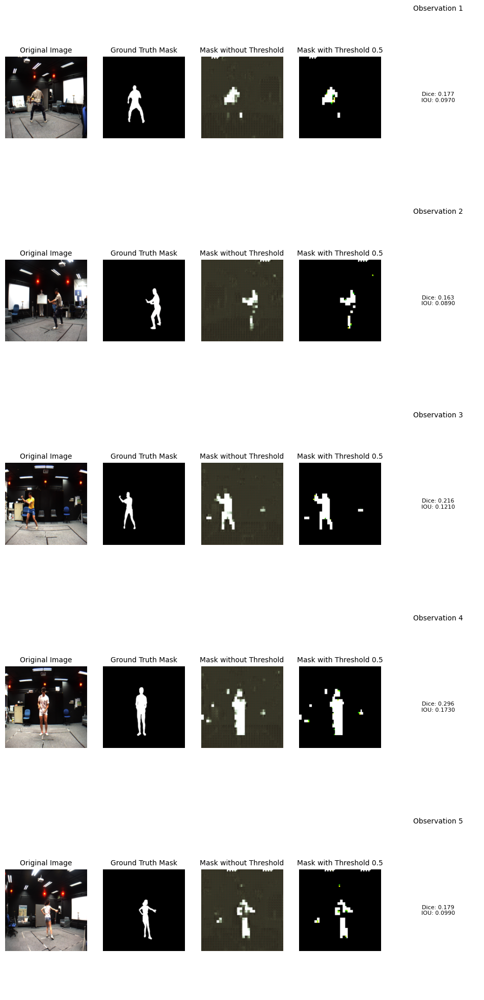

In [ ]:
# Get some sample inferences
inference_plot_mask(model_0, test_dataloader, device, THRESHOLD, 5)